In [168]:
#!pip install stop-words

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re, string
import nltk 
from nltk import ngrams
from nltk.corpus import stopwords 
from nltk.tokenize import word_tokenize
from nltk.tokenize import sent_tokenize
from nltk import FreqDist
from nltk.stem import WordNetLemmatizer,SnowballStemmer
nltk.download('punkt')
nltk.download('stopwords')
#from stop_words import get_stop_words

[nltk_data] Downloading package punkt to /Users/diabelny/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/diabelny/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [2]:
#import and visualize dataset
df_tweet = pd.read_csv("OriginalDataset.csv", skipinitialspace=True)
df_tweet

,Unnamed: 0,Toxicity,tweet
0,0,0,@user when a father is dysfunctional and is so...
1,1,0,@user @user thanks for #lyft credit i can't us...
2,2,0,bihday your majesty
3,3,0,#model i love u take with u all the time in ...
4,4,0,factsguide: society now #motivation
...,...,...,...
56740,56740,1,you's a muthaf***in lie &#8220;@LifeAsKing: @2...
56741,56741,1,"you've gone and broke the wrong heart baby, an..."
56742,56742,1,young buck wanna eat!!.. dat nigguh like I ain...
56743,56743,1,youu got wild bitches tellin you lies


In [46]:
df_tweet.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56745 entries, 0 to 56744
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  56745 non-null  int64 
 1   Toxicity    56745 non-null  int64 
 2   tweet       56745 non-null  object
dtypes: int64(2), object(1)
memory usage: 1.3+ MB


In [47]:
#delete the indexes column
df_tweet = df_tweet.drop(["Unnamed: 0"], axis=1)

In [48]:
df_tweet.describe()

,Toxicity
count,56745.000000
mean,0.425641
std,0.494444
min,0.000000
25%,0.000000
50%,0.000000
75%,1.000000
max,1.000000


In [49]:
# 0 means "not toxic"
# 1 means "toxic"
# there are more "not toxic" tweets
df_tweet["Toxicity"].value_counts()

0    32592
1    24153
Name: Toxicity, dtype: int64

In [50]:
#to understand if a tweet is repeated or re-shared
df_tweet["tweet"].value_counts()

#model   i love u take with u all the time in urð±!!! ðððð
ð¦ð¦ð¦                                               319
i finally found a way how to delete old tweets! you might find it useful as well:    #deletetweets                                  82
aww yeah it's all good bing bong bing bong                                                                                          75
i'm so   and #grateful now that - #affirmations                                                                                     56
@user you might be a libtard if... #libtard  #sjw #liberal #politics                                                                40
                                                                                                                                  ... 
drake has always been babe &amp; i never been to one of his conce   ðð©                                                         1
i'm a little bit sad,here is a rainy day...what can i d

In [51]:
#Return boolean Series denoting duplicate rows.
df_tweet[df_tweet["tweet"].duplicated()]

,Toxicity,tweet
46,0,#model i love u take with u all the time in ...
96,0,#model i love u take with u all the time in ...
117,0,#model i love u take with u all the time in ...
162,0,#model i love u take with u all the time in ...
218,0,#model i love u take with u all the time in ...
...,...,...
31886,0,100 amazing health benefits of cucumbers! #...
31904,0,#model i love u take with u all the time in ...
31930,1,@user #feminismiscancer #feminismisterrorism #...
31951,0,i've just posted a new blog: #secondlife #lone...


In [52]:
#remove duplicates in the tweets column in the dataset and keep the last occurrence of each tweet
df_tweet =df_tweet.drop_duplicates(subset=['tweet'], keep='last')

In [53]:
#to test if the drop_duplicates worked
df_tweet["tweet"].value_counts()

@user when a father is dysfunctional and is so selfish he drags his kids into his dysfunction.   #run                                       1
@mflagginski I live in the eye of a white trash hurricane. Milwaukie OR. Where people use bikes BC of DUI's not to save the environment.    1
@mhs_austin drive you nigger                                                                                                                1
@mia_coop speaking about me all the time tryna make me look bad like you wasn't just eating my pussy .                                      1
@michaeldbirch What else do you expect from that nigger lover?                                                                              1
                                                                                                                                           ..
 @user hoping everyone is having a weekend filled with memorable experiences,   saturday                                                    1
do you

In [54]:
#to see if there are null values between tweets --> no null value present
df_tweet["tweet"].isnull().value_counts()

False    54310
Name: tweet, dtype: int64

In [55]:
#to see if there are null values in the toxicity column --> no null value present
df_tweet["Toxicity"].isnull().value_counts()

False    54310
Name: Toxicity, dtype: int64

In [56]:
#recount toxic values ​​after deleting duplicates 
# 0 means "not toxic"
# 1 means "toxic"
# there are more "not toxic" tweets
df_tweet["Toxicity"].value_counts()

0    30387
1    23923
Name: Toxicity, dtype: int64

## TWEET TEXT CLEANING

In [57]:
new_stopwords = stopwords.words('english')

In [58]:
#print all sentences/tweets
for sentence in df_tweet[:]["tweet"]:
    print(sentence)

@user when a father is dysfunctional and is so selfish he drags his kids into his dysfunction.   #run
@user @user thanks for #lyft credit i can't use cause they don't offer wheelchair vans in pdx.    #disapointed #getthanked
bihday your majesty
factsguide: society now    #motivation
[2/2] huge fan fare and big talking before they leave. chaos and pay disputes when they get there. #allshowandnogo  
@user camping tomorrow @user @user @user @user @user @user @user dannyâ¦
the next school year is the year for exams.ð¯ can't think about that ð­ #school #exams   #hate #imagine #actorslife #revolutionschool #girl
we won!!! love the land!!! #allin #cavs #champions #cleveland #clevelandcavaliers  â¦ 
@user @user welcome here !  i'm   it's so #gr8 ! 
â #ireland consumer price index (mom) climbed from previous 0.2% to 0.5% in may   #blog #silver #gold #forex
we are so selfish. #orlando #standwithorlando #pulseshooting #orlandoshooting #biggerproblems #selfish #heabreaking   #values #love 

#pink #wednesday ! ;) #onwednesdayswewearpink #goodmorning #morningmotivation half of theâ¦ 
tdc tv why will the @user @user @user etc...not even return our calls... ...stop patronizing #pwd
here to do yoga in the park..   #byobcoaching (@ bryant park) on #yelp 
 fathersdaymessage  #fathers #day #message buy things about "happy fathers day â¦  
possible future:the year is 2100 and we advanced so far laziness is not a issue,so.... #hug #futureofwork   
i bet! #baylor better pay him before he unloads on them. best to keep things still hidden #baylor #bears #big12   
feeling, smiley âºï¸ #selfie #smile   #photooftheday #positive #positivevibes #summer #day# 
 @user follow these 9 simple steps to keep your mice  , #healthy, and stress free. #animalresearch 
it is not just the tampered which is hampered it the #iphone  â¦ 
it's raining in #coimbatore. nothing comes close this city climate. #cool  
hello! #me   #selfie #cold 
the greatest #dad the simples #dad thank you #dad for everyth

when everyone you work with left to go meet @user and you are stuck at the station rolling prompter.   
father's day to all the real &amp; caring  fathers... #god bless u all fathers and bless me too... cheers...!!!
newhairâ¨ð #lapis#rollen#new#hair#brond#gradation#my #instapic#instagram#instagood#l4l#girl#gâ¦ 
#love... people sta talking about it rather then #feeling it.  isn't it  ?
hanging out before boating! #fun #smile #boats #chive   #mottleyengagement #bmottphotoâ¦ 
love. this. #samples #freebie #poshlife #vegan #naturallybased #nofillers #summer #fun   #pampered #order #join 
peace of mind #serenity  
@user i feel so lonely ð.   love lovequotes #love #lovehus #lovequotes quotes huquotes #broken #reâ¦ 
i'm at the theatre waiting to see chitty chitty bang bang   #funtimes #surprise 
new #makeup today.. yay âºâºâº   #satisfied #yay #beautiful 
this too shall end! yes âºï¸   #motivated
just pre-ordered my copy!   #harrypotterandthecursedchild #magical 
 @user omg the

join me tonight as i live tweet the opera la boheme at @user follow the hashtag #otslboheme for the tweets!   #stlopera
stuakenyon81 #cover #reveal!  swiftly sharpens the fang , #radicalisation &amp; #revenge eevalancaster 
and there it is, the face of the first ever slim pup to make her debut sat night   #daddy'swatchingclosely 
happy fasting guys....    #fasting #beabetterhuman #amen  #peace #ramadhan 
git the prototype for our new usb today! what do you think? #new product #doncasterphotographer   #special 
via:    bihday natalie poman! #hotgirls 
note for those who call #wn  for opposing the latest @user ad: damn right we are! get that filth off the net, you race-traitors-
#prayfororlando #orlando #pray   #praying #pulse #love #compassion #lgbt #peace i neverâ¦ 
can't help #smiling when i #color this!   #saturday take time for yourself #relax 
the blessings of the lord add no sorrow!    fathers day to all the responsible fathers! blessed sundayâ¥
new logo and website design under

oh right here, cause i need  little love a little sympathy...ðµð #sugar #maroon5 #love  â¦ 
@user are you coming to @user conference by train? there will be a bunch of us waiting to greet you at mk station! #ousâ¦
heir to the throne!!! #ceegee #smcr   #king #girls #cute #summer #blur #sun   #fun #dogâ¦ 
â #fomc committee to maintain the fed funds target range unchanged â danske bank   #blog #silver #gold #forex
hbo @user confirms super-sized season 6 finale   #winteriscoming  @user
the way i feel today   #focussed #weekend #lotstodo #team #family #training 
@user it was in ceain areas yeah, you not seen the videos? seeing little kids cry didn't do it for me!  
np of #miatindall and #zaraphillips attend #polomatch in #gloucestershire ð -18/06/16 #cute #love #baby   
an abomination, unfathomable...how one man killed 50and injured 54 #orlandoshooting   
out and about   ðâ¤ï¸ 
gmorming everyone ð£  weekend #weekends #fresh #weekendfun #blessed  #morningsunshine â¤ï¸

#theconjuring2 come on-come on âºï¸ @user   
@user is @user gone?!  
keep smile and be happy ðâ¤ð  #smile   #keepsmile #selfie #begrateful #blessed #blessâ¦ 
a bit  : last #balletclass at the #roh for this season! thank you to everyone who shared thisâ¦ 
@user @user @user @user @user @user @user he was having the best time!   ð
even with the stitches, i'm still breathing...   #blackandwhite   #night 
  are those who take life day by day, complain very little, and are thankful for the little things in life ... 
@user meet @user @user on 10th august. book at any library in york  #vangogh #amaniknew   
islam against racism  
always be   #footfault 
i told my parents that i didn't want to go to college right away and how i don't want to be a baker anymore and they took it well  
good morning.. @user oh   day..watching my show #cakeboss .. ðâ how are you
@user ..when my mood is not good.. . . #mood #good #notgood #burn #notfun #fun #funny #is #feel  â¦ 
 fathersdaymessag

a few changes to #chapter 4 from the beta-reader &amp; we totally nailed the outline of book 2.   now. #amwriting #amediting #firstnovel
 @user  , wait til you see my smile by #mariamiguel 
clueless top nyc cop william bratton promises 2 lead the nation in small #marijuana arrests   â&gt; 
when you try to control everything, you enjoy nothing.  #live #in #the #moment #relax #mindful #wisdom   #life 
every time i hear the ice cream truck, i'm just happy. songs do trigger memories. #songs #trigger #memories #icecream #truck  
beautiful wedding in temecula. #photobooth #dj #superflyphoto   #smile #temecula #menifeeâ¦ 
 @user mean people suck, so i wrote the book on nice. nice guys finish first. #smb    
hardcore playlist mother sex movie  
saira's on the way to her new smile    #invisalignjourney 
when they call us   #homophobic  #misogynist  they are really saying that they are jealous of us. when we go up they go down.
don't forget the women who are misogynists! 
love me some toy swa

where i belong ... ð¤ð #life   
been to pick these up today!! four years on the bounce!   #silverstone #britishgp2016 
i didn't know crowder was such an ass...   
so   about @user loving our new menu!  thanks for stopping by the shop!  #soinoodlebar #canberra #yum 
our brand new training centre is staing to come together!!!!   #norwich #trainingâ¦ 
congrats @user forward to getting stuck in..see you in a couple of weeks! #natwestrugbyforce 
just had the first glimpse of the cover a for our new printed and online @user - wow. it's an original piece of a.  
@user  yep waiting to watch #orangeisthenewblack so we can be done with it in 2 days #bingewatch #netflix   #netflixandchill
#theresistance #notmypresident not ever #treason @user #narcissist  #gaslighting 
â¤ðâ¤ happy friday! ð 
@user our md @user will be speaking at this year's driverless technology conference  @user
sometimes that's all you can do... #staystrong #wendsday   #disappointed #queen 
#whiskerswednesday eve

i always try to do my best to express my feeling to @user but unfounately my english is sucks :(   
#ruleoflaw for #kamalnath is no diff frm rule of law in case of safrron terror sadhvi.    
@user i would've thought the lgbt community wanted suppo &amp; unity from all. 's indicate many prefer labels &amp; separation.  &amp;odd
#sorry #potus this #bigotry is fully #american    #obama blasts #trump for #antimuslim #language,as #unamerican
@user #allahsoil neoliberalism prioritized money and oil over pretty much everything else.   â¦ â¦â¦ 
the endððð #selectivo2016 #adiosexamenes   #instavideo #video #nice #cool #me 
at least 50 dead in worst mass #shooting in u.s. history #soundtrainingnews   #orlando #florida 
#petal   polar bear climb racing: angry polar bear climb racing, the polar bear living in cold places lookin 
so gassed with how my life is going at the moment #proud  
@user should be asleep with my boo rn but i'm not  
i really wish common sense would come back in st

sad to hear about 2yr old at disney    #disneygatorattack
my dorm is gonna look like something like this   
father's day. daddy you will always be ma hero. return if possible(rip).we miss u. 
i am thankful for cats. #thankful #positive     
thank you dads. you rock. you are rocks. #fathersday   #fathers #keeponkeepinon #love #you 
am i the only one who wishes they'd make a 8th season of @user ? i love that show, on @user but it ended.  
#trinationodi was   #cricket match in guyana i will like to say thank you to @user &amp; the 3  teams @user @user @user
happy bihday #icecube yesterday and legendary #tupac today .   bihday #legend #hiphop 
@user screaming #lolathecockatoo #screaming #crazy   #hyper #running #windowsi... (vine by lola the cockatoo) 
@user super duper lovely ðð   #dance
@user yours was better because on the road to your title you made saban   
we live in a country where many think this first lady is less vulgar than a black first lady.  #trumpâ¦ 
@user already lam

  #bihday ðsurround yourself with people who #love you, #motivate you, #encourage you andâ¦ 
globalists/obama/hillary try 2 destroy 1st &amp; 2nd amendment. let's put trump in wh now!! @user  
 @user @user  ma'm is this way justice being served 2 doctors,so called 2 hav brightest brain    #rowdyrathoreagainstdoâ¦
i am thankful for creativity. #thankful #positive     
the cavs game plan worked.... i'm srry the nba game plan worked.... suspend green, and the cavs win smh this is pathetic #nbafinals  
shopping for my girl's bachelorette pay. ð   
my radio show is in less than an hour !!! #hype   #exclusive check it out at 
heading out for dinner #hungry   
i loved it! #got more seeing todo next week let me know when your free  x  
happy bihday to me! thank tiu @user for the wonderful weekend!! #bihday   #hukilauâ¦ 
friday!!ðð°ð¼â¨  #anotherwomanwedding #bridetobe   
â #ecb patiently awaiting impact of latest measures â danske bank   #blog #silver #gold #forex
@user th

lovely  message.  love  and  help.   #aejazsaiyed #ahmadabad   
come come galleta :*   #1aÃ±o #andrÃ©s #muecas #bocadepatoâ¦ 
you know your life's sad when your boss says " he's gonna help find you a girlfriend"  
"even if you like #windows 10, you should be   at #microsoft" #computer #spam #spyware #unreliable #os #ms #win 
ð ð ð #love #instagood #photooftheday top.tags #tbt #cute #me #beautiful #followme  â¦ 
wow! no @user in #tennis for 2 years.  . leave the performance enhancers and hit the gym harder. 
whatâs the matter with noh carolina? from progressive to reactionary  #fascism  #lgbt
ð´ðð´ #summer#hot#friday #holidays#letsgo 
@user highlight of my europe trip with @user watching a bbcworld documentary about wood carving   #inspiration #trâ¦
@user you're a loser with 27,000, soon we will have more fans then you.  
so i'm now accepting "bff applications" because it seems like everyone has one and i don'tð..hit me up for the deets lol #imaloner #lol  
@user

@user more plays i haven't heard of!  
awesome time with my youngest. #picoftheday #fun #instalike #life   #cute #smile 
@user really well done and a good read,   blogging
@user #cover #reveal!  swiftly sharpens the fang , #radicalisation &amp; #revenge @user 
another happy customer of tom's. congratulations to the clark family on your new 2016 silverado!   #customer 
btw, fuck blm and fuck that bitch which is real . any simpleton can figure that one out. @user
â #brazil: markets continue to price in perfection - bbh   #blog #silver #gold #forex
could be buying a new car today  
video from a couple of months ago.   gays must die says speaker at orlando mosque wftv 9 orlando repo  @user
after the storm comes a calm... # rainbow #keywest #islamorada #livinglife #living  â¦ 
@user they are, but #anc  laws against whites protects blacks in #southafrica. #affirmativeactionâ¦ 
@user just wondering when the next book in the series will be out?   #bestbooksever
i got the job.!!!! time to p

so gritty    happy joy joy [v live] exo_monster_music video  
just over a week to go till lichfield stas #lounging   
#watchdogs2 can't come soon enough  
@user so what do you do when you have 1/4 of a bottle left &amp; the dispenser stops working? #lunarorossa #100ml   
#snapshot   gorilla simulator: you need to do to adapt to the environment. the need to tear the city. materi 
so now that my metcon 2s came in the mail, i guess i'm getting my butt to the gym #motivation #newshoes   #fitfam
#wishing all #loving father   #father's #day. . .
#hawaiibound â for the next 10days! ððð¨ð²âï¸ð´ð³ðð£ð#sun #sand #poke #locomoco #honeymoon  â¦ 
#lapride &amp; #bihdayweekend #vibes in the #hollywood hills ð´âï¸ðºð¸ð   #gayboy #fitfam #lgbtâ¦ 
#bihdays #good-day  -puppy #animals #cute #funny  special day, special ... 
#ubie3   i've waited all day for this!!!!
waiting for a phone call to let me know when my new house will be ready   #hurryup
mere words don't 

@user you anti-whites brag about our "inevitable brown future" then scream "" when we oppose it. you're pushing #whitegenocide.
music is the only escape for this generation of teenagers. ð¶  #citation #quote #teenagers #music   #reality #escape
you disgust me 
the house that for months had a bernie sign in the yard is now sans sign but the car has a hillary sticker. subtle concession?  
my sleep has been so good recently:) im  
i couldn't agree more! 
love being gagged! 
so   to have been able to go to a #braves #baseball #game atâ¦ 
this one is super challenging.   #urbacity #yyj #runvi #yyjevents #superhero #fun  â¦ 
@user +zig zag way is show 2b proud of top cast+great backstage team lovely script awesome music #encore #cornish #powerful #funny  
they have to ... everyone's carrying it - they just doing something different ð 
so unbelievably unprofessional, unhelpful and rude @user  the shine has well and truly been removed from stephen's new suit.  
@user usually run much fu

&#128588;RT @Nay_btw It amazes me how niggas can fuck w/ EVERY bitch but when a nigga try to talk to his bitch he wanna cry about it&#128533; I need answers
&#128700;&#128700;- you a little genius man i need you for a class so u can help a nig out but you cool af man
&#191;Como se llama el ni&#241;o m&#225;s delgado de Jap&#243;n? Yocomo Poko

&#164;&#176;&#164;&#176; gino &#176;&#164;&#176;&#164;
&#193;lbum de fotos: csitaly: [TS3]Fairy Tail - Satan Soul Mirajane Strauss made with The Sims 3. Happy... http://t.co/b4i8EiMux2
&#193;lbum de fotos: gaywrites: In the Making, a project by and for queer students at Harvard, highlights the... http://t.co/XZQ9XmaQTf
&#8216;Chillin&#8217; With My Homie Or What&#8217;s Left Of Him&#8217;: British Rapper Turned ISIS Jihadi Poses With Severed Head http://t.co/L9vMdNOXPg #tcot
&#8220;@0ddtoddler: When people refer to their girlfriend as their "bitch" &#128528; ....&#8221; I know how it sounds but it's how we mean it lol
&#8220;@1_anddone: Fuck east

@BallBagSteve hoe b4 bros..smh.
@BallOut057 I'm otp bitch hold on
@BallardTheG_ get this nigguh of this streets
@Bam_N_DeyMouth grindin cuzz thats all shit dont stop wats good witcha thou bitch you been mia too
@Bam_N_DeyMouth you already know ima keep it trilla...Happy Bday lha bitch i love yu nigga!
@BangxBroz right in the pussy
@BarackObama @MarchForInnov send them damn beaners back where they belong n the US aint it
@BarackObama @MichelleObama omfg you elitist bitch no one cares what you think! go fuck yourselves are you in china anyway?
@BarackObama Biden was a winner last night? Yea right like Charlie Sheen Really was a a winner too.... #winning lol
@BarackObama glad you brought that kid home, but he fucked up and should face the UCMJ. don't care about Taliban pussies really.
@BarackObama l voted and supported u and u pulled the rug out from under us, a nation and worse, cuz were not in "your circle" were trash.
@BarackObama make weed legal you pussy you know you smoke that shit


@ShotMoistBoyce you be fucking with to many hoes .
@Shvkxir @RickiRoma @BaeSongz @JayZOverrated Ahmed and retard mikey for special Olympic boxing
@SicilianInHeels @y3lla lol that's basically like the "you got too many hoes" curve
@SideHoeNextDoor with your height, yeah. Chunky bitch
@SierraBell15 just called me a basic bitch and I'm not sure how I feel about it
@SilverbirdUSA and retarded. Love is always retarded. #sentimental
@SimonCowell what a little bitch
@SimoneNicole3 follow me u sexy bitch
@SimplyAJ22 lebron is a bitch #damian
@SinexDerek those guys are pussies &#128527;&#128079;
@Sisson11Noah there is a bird here on the ground and it's still alive I can't believe it
@Sisteena_ And does he know you're calling him a fag?
@SkinnyKenny13 @Zaytovenn__ shiddd add me I a turn that bitch up lmao
@SkippyLongDick i will literally confront some bitch asses! Fo reall. Trill.
@SlimGirl_Probz das calld usen yo brain retard y would i whoop yo ass n front of da police
@SlothNG i can guarantee 

@maliktender gayer then 2 faggots in bed together&#128129;
@mallenokc @royceyoung extra yellow.
@mandaxll2963 yellow is even better
@marclamonthill all #nfl stadiums play music by jay-z a former drug dealer whose diaphragm wouldnt work w/o saying nigger in every song
@marclamonthill will you mention why being called nigger is wrong(witch i agree with) &amp; bossy is wrong.but being called a pimp is still ok?
@marcostc__ niggas be pressed 4 pussy
it ain't nuthin
instead of worrying who dat bitch fucking 
why don't u get chu sum money
@marcostc__ you're right momma ain't raise no faggot
@marcus2kings yeah hoe ass nigga &#128532;&#128532;&#128532;
@mariaisab3lla at that point, just call me nigger.
@marissaaxoo @kakestevens @mandaclementine someone needs to give these bitches a gatoraide or ten
@marissarose_10 
Your mouth
Your pussy
Your ass
My dick
And a sandwich after we fuck.
What kinda question is that?
@mark_mac18 @sheppast @rianscalia groves is trash IMO
@markoketchuck the black girl

Damn I hate a bitch that like to argue and shit
Damn I hate a bitch who like to argue and shit
Damn I think your redskins lost @KxRxSxB
Damn I use to be a big fan of Ronda, but so far she's been a big cunt #TUF
Damn I'm in da mood to eat sum pussy who got it fresh on a platter for me # teamfluffnevabluff
Damn Joe Buck just making it sound like Greinke was trash when he played for the Royals. Chill out Joe.
Damn Kaepernick is trash man
Damn Karlie Redd, now all these hoes done seen your man junk
Damn bird nearly gave me a heart attack...! And all she said was "Oh." Bitch Oh..??
Damn bitch gotta bootay
Damn bitch thnx http://t.co/TwDKCKKTaz
Damn bitch you nosey please don't touch my phone please
Damn bro im hungry then a hoe rt and ain't got shit to eat at the crib fuckkkk
Damn change change niccas
Damn girl I'll be your porch monkey
Damn hoe.. You so ugly even hello kitty said goodbye.
Damn internal alarm clock. Woke up at 6:35am feeling chunky from my 3am Cheerios splurge. Guilt led me

I should probs shave my spic stash soon, its kinda getting out of hand
I should start wearing beanies more
I should've fought you when I was over there if only I was myself and I haven't popped that talking about u only need two hits bitch please
I should've thrown a whole roll of pennies and made her month that bitch.
I show do like The Jeffersons. Dat George make me wanna open up a dry cleaning stow and call all da white folk honkey
I show love to everybody not on joe time i just hate stuck up people thats hoe shit
I slam duunkk hoes cuz I can't lay up
I slept good thenna bitch tho
I smell I smell I smell, pussy
I smoke a fat pound of grass, and fall on my ass, faster than the fat bitch who sat down to fast.
I smoke a lot of weed to keep them bitches of ma mind
I snorted shit with more girls in my presence than a dude lmao coke head bitches..
I sound retarded but he is learning quickly! @tyler_yost http://t.co/4vqH4zBwml
I spend my money on weed clothes n food not hoes
I spent my who

Mann that pussy #ThrowBack
Mann.. Jada Pickett was a badddddd bitch #Lawd
Mannnn tonight feels like trash.
Mannnnnn these hoes aint loyal
Manual labor so trash
Many people claiming slippery slope is now absolute are same ones who said slippery slope is an argument for the paranoid delusional. #tcot
Maple Room bitch SACTO STYLE
Marca got so many hoes she confused on what to do
Marcus Colston so damn trash.
Marcus Smart belongs on the Celtics. Both trash. It was destiny.
Marcus is in this hoe schleeeeeeeeeeppppppp
Marijuana turn good pussy great..
Marijuana, hydro, pussy hoe, ass titties
Marilyn Monroe set the standard for what hoes can achieve in society
Mark Teixeira finally stepping up, HR and couple of BBs #Yankees
Married a skinny bitch but trickin wit a thick bitch.. She got sum big hips I call that boa a hypocrite
Mary Jane is a dumb bitch
Peter has a job saving the city as Spiderman and she's bitching about how he hasn't came to her play
Mata'i ngeli, alu o polosi ho nifo..
Math 

RT @FightCIubs: Resisting the urge to smack a bitch http://t.co/kwe5j13O9b
RT @FightsOnVine: Bruh this bitch is possessed by the thot demon https://t.co/6fa2iiXs6m
RT @FightsOnVine: She used her hair to throw her then kicked her in the head THEN called her a bitch &#128553;&#128514; https://t.co/JUywZNabP5
RT @FillWerrell: That son of a bitch moment when you're walking around the house with socks on and step on a random wet spot...
RT @FilmFatale_NYC: Wow, he basically just told his daughter "I want some mocha colored grandbabies!" #HTGAWM
RT @FirearmsDaily: Statistics don't lie, if you like gun control you're a queer guy. #FD
RT @Fit4LifeMike: @Whitecholo23 @chanelisabeth true i need to sleep to make them Gainz bruh!! So all the hoes stay Mirin ;p 
Alright, later&#8230;
RT @Fitcchh: White girls that talk ghetto&lt;&lt;&lt; you're not cute&#128514;
RT @FleeBiscuit: Girls with anchor tats are hoes
RT @FleeBiscuit: I look in the mirror and see a pussy ass bitch that sits down when he pee

RT @ShadowBeatz_Inc: I know you have me blocked, but next week bitch @KYR_SP33DY
RT @ShadyLadyHH: When the rose-colored glasses come off and you still want to be there, true love happens.
RT @ShaeBoogie__: Some bitches only cute when they mouth closed, that smile is what fuck yall up bye teeth &#128514;&#128514;&#128514;&#128074;
RT @Shakestweetz: Friends of @philbarron: @javachik has let me know that Phil is very ill. His infection has gone septic, and he is fightin&#8230;
RT @Shakilaahh: - LOOOOOOL&#128557; 2nd best tweaking hoe vine&#128557; https://t.co/m6Anq9CQS9
RT @Shalewis09: Larry Elder is an Uncle Tom. I cannot believe how he is degrading a child.
RT @ShamarGotHoes: J Cole ain't trash... Period.
RT @ShamarGotHoes: These hoes... Smh http://t.co/PRr9JkrBSp
RT @ShanTaughtUwell: Never trust a bitch that try to be a side bitch
RT @Shan_RBM: They say crazy girls got the best pussy&#128530;
RT @ShaneDennis37: In the "Nothing Lasts Forever" category, I can barely recognize any Yankee

RT @joytooawesome: @gorgeouss_kee @vintage_monroe_ bitch nooooo ! Kim been mine you dreaming
RT @joytooawesome: @im_jessicaaaaa @vintage_monroe_ bitch no I'm talking to her !
RT @jpayneancap: @A_M_Perez @sybilll @DianneWing2 @velvethammer @MyLibertyMyGun @sdalexander11 @Aoakleyc I bet she's a New York Yankee prog&#8230;
RT @jrsalzman: Buzzfeed males who live in the city and buy meat under plastic, mock girls who use guns and go hunting. Who is more manly?
RT @juanadog: Dallying is for bitches, bro. I dilly, exclusively.
RT @judiebaby_: @Vnxthny ATTENTION !!! Keshonna Alexander had the best pussy in the world. Taste good asf&#128523;&#128523;&#128525;&#128536;&#128079;&#128588;&#128514;&#128514;&#128514;&#128553;&#128540;&#128523;&#128523;&#128525;&#128525;
RT @juiceman829: @herk87 @RealMichaelKay how much does your wife wet pussy want another dick. #BIG HEAD
RT @juicygenie: @thotpockets fat bitches that think they cute
RT @juicygenie: Sheryl crow be my mom
RT @julia_rodd: When kennies 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [3]:
#file txt with all tweets but not cleaned yet
file = open("fileTweets.txt", encoding="utf8")
text = file.read()
print(text)

@user when a father is dysfunctional and is so selfish he drags his kids into his dysfunction.   #run
@user @user thanks for #lyft credit i can't use cause they don't offer wheelchair vans in pdx.    #disapointed #getthanked
bihday your majesty
factsguide: society now    #motivation
[2/2] huge fan fare and big talking before they leave. chaos and pay disputes when they get there. #allshowandnogo  
@user camping tomorrow @user @user @user @user @user @user @user dannyâ¦
the next school year is the year for exams.ð¯ can't think about that ð­ #school #exams   #hate #imagine #actorslife #revolutionschool #girl
we won!!! love the land!!! #allin #cavs #champions #cleveland #clevelandcavaliers  â¦ 
@user @user welcome here !  i'm   it's so #gr8 ! 
â #ireland consumer price index (mom) climbed from previous 0.2% to 0.5% in may   #blog #silver #gold #forex
we are so selfish. #orlando #standwithorlando #pulseshooting #orlandoshooting #biggerproblems #selfish #heabreaking   #values #love 

In [59]:
#This part of code was used only for the topic modeling
#file of all tweets put as sentences, cleaned only by "@user" (that are the mentions), numbers and special characters
"""text = text.replace("@user","")
text = re.sub(r'[^\x00-\x7f]',r'', text) #remove non utf8/ascii characters such as '\x9a\x91\x97\x9a\x97'
text = re.sub(r'[0-9\.]+', '', text) #remove numbers
f = open("file_Frasi.txt", "w")
f.write(text)
f.close() """
#text

'text = text.replace("@user","")\ntext = re.sub(r\'[^\x00-\x7f]\',r\'\', text) #remove non utf8/ascii characters such as \'\x9a\x91\x97\x9a\x97\'\ntext = re.sub(r\'[0-9\\.]+\', \'\', text) #remove numbers\nf = open("file_Frasi.txt", "w")\nf.write(text)\nf.close() '

In [60]:
#function definition. This function was used to transform words from contracted form to extended form
def fullwords(text):
    text = re.sub(r"can\'t", " can not", text)
    text = re.sub(r"won\'t", " will not", text)
    text = re.sub(r"n\'t", " not", text)
    text = re.sub(r"\'re", " are", text)
    text = re.sub(r"\'s", " is", text)
    text = re.sub(r"\'d", " would", text)
    text = re.sub(r"\'ll", " will", text)
    text = re.sub(r"\'t", " not", text)
    text = re.sub(r"\'ve", " have", text)
    text = re.sub(r"\'m", " am", text)
    text = re.sub(r"wasn\'t", " was not", text)
    text = re.sub(r"i\'ve", " i have", text)
    text = re.sub(r"don\'t", " do not", text)
    text = re.sub(r"didn\'t", " did not", text)
    text = re.sub(r"aint", " am not", text)
    text = re.sub(r"you\'re", " you are", text)
    text = re.sub(r"isn\'t", " is not", text)
    text = re.sub(r"w/", " with", text)
    text = re.sub(r"w/o", " without", text)
    text = re.sub(r"w/out", " without", text)
    text = re.sub(r"thanx", " thank you", text)
    text = re.sub(r"shyt", " shit", text)
    text = re.sub(r"pls", " please", text)
    text = re.sub(r"youve", " you have", text)
    text = re.sub(r"cant", " can not", text)
    text = re.sub(r"dont", " do not", text)
    text = re.sub(r"im", " i am", text)
    text = re.sub(r"iam", " i am", text)
    text = re.sub(r".f\*\*\*.", r" fuck", text)   
    return text

In [61]:
#Function to remove emoticon, punctuation, links, stopwords, mentions and \r\n new line characters
def strip_all_entities(text): 
    text = re.sub(r'(?::|;|=)(?:-)?(?:\)|\(|D|P)', '', text) #remove emoticons
    text = re.sub(r'http\S+', '', text) #remove links
    text = re.sub(r'(@\w+)|#|&|!', '' ,text) #remove mentions
    text = text.replace('/', ' ') #remove "/"
    text = text.replace('\r', '').replace('\n', ' ').lower() #remove \n and \r and lowercase
    text = re.sub(r'[^\x00-\x7f]',r'', text) #remove non utf8/ascii characters such as '\x9a\x91\x97\x9a\x97'
    text = re.sub(r'[0-9\.]+', '', text) #remove numbers
    banned_list= string.punctuation #remove punctuation

    table = str.maketrans('', '', banned_list)
    text = text.translate(table)
    
    text = [word for word in text.split() if word not in new_stopwords]
    text = ' '.join(text)
    text =' '.join(word for word in text.split() if len(word) < 14) # remove words longer than 14 characters
    return text

In [62]:
#funzione apply prende una funzione come input e applica questa funzione a un intero DataFrame.
#Se si lavora con dati tabulari, bisogna specificare un asse su cui vuoi che la tua funzione agisca (0 per le colonne e 1 per le righe).

#in a new temporary column "tweet_clean1" we save the result of the fuction "apply" on the tweet column in our dataset
#function apply takes a function as input (in this case the function "strip_all_entities") and apply it across the entire column of the dataset
df_tweet['tweet_clean1'] = df_tweet['tweet'].apply(lambda x: strip_all_entities(x))
#in a new (definitive) column "tweet_clean" we save the result of the fuction "apply" (with "fullwords" function as input) 
#"tweet_clean" is the new column of the dataset where the text of each tweet has been cleaned up
df_tweet['tweet_clean'] = df_tweet['tweet_clean1'].apply(lambda x: fullwords(x))

#eliminate duplicates, if any
df_tweet.drop_duplicates("tweet_clean", inplace=True)

In [63]:
#eliminate the temporary column "tweet_clean1"
df_tweet = df_tweet.drop(["tweet_clean1"], axis=1)

In [64]:
#to test if the drop function worked well 
df_tweet.columns

Index(['Toxicity', 'tweet', 'tweet_clean'], dtype='object')

In [65]:
#to test if the cleaning functions worked well
df_tweet['tweet_clean'][56741]

' you have gone broke wrong heart baby drove redneck crazy'

## TOKENIZATION

In [67]:
#TOKENIZATION
def tokenization(text):
    text = re.split('\W+', text)
    return text

df_tweet['tweet_tokenized'] = df_tweet['tweet_clean'].apply(lambda x: tokenization(x))
df_tweet['tweet_tok=2'] = df_tweet['tweet_tokenized'].apply(lambda words: list(nltk.ngrams(words, 2)))
df_tweet.head(10)

,Toxicity,tweet,tweet_clean,tweet_tokenized,tweet_tok=2
0,0,@user when a father is dysfunctional and is so...,father dysfunctional selfish drags kids dysfun...,"[father, dysfunctional, selfish, drags, kids, ...","[(father, dysfunctional), (dysfunctional, self..."
1,0,@user @user thanks for #lyft credit i can't us...,thanks lyft credit can not use cause do not ...,"[thanks, lyft, credit, can, not, use, cause, d...","[(thanks, lyft), (lyft, credit), (credit, can)..."
2,0,bihday your majesty,bihday majesty,"[bihday, majesty]","[(bihday, majesty)]"
4,0,factsguide: society now #motivation,factsguide society motivation,"[factsguide, society, motivation]","[(factsguide, society), (society, motivation)]"
5,0,[2/2] huge fan fare and big talking before the...,huge fan fare big talking leave chaos pay disp...,"[huge, fan, fare, big, talking, leave, chaos, ...","[(huge, fan), (fan, fare), (fare, big), (big, ..."
6,0,@user camping tomorrow @user @user @user @user...,camping tomorrow danny,"[camping, tomorrow, danny]","[(camping, tomorrow), (tomorrow, danny)]"
7,0,the next school year is the year for exams.ð...,next school year year exams can not think sch...,"[next, school, year, year, exams, can, not, th...","[(next, school), (school, year), (year, year),..."
8,0,we won!!! love the land!!! #allin #cavs #champ...,love land allin cavs champions cleveland,"[love, land, allin, cavs, champions, cleveland]","[(love, land), (land, allin), (allin, cavs), (..."
9,0,@user @user welcome here ! i'm it's so #gr8 !,welcome i am gr,"[welcome, i, am, gr]","[(welcome, i), (i, am), (am, gr)]"
10,0,â #ireland consumer price index (mom) climbe...,ireland consumer price index mom cl i ambed pr...,"[ireland, consumer, price, index, mom, cl, i, ...","[(ireland, consumer), (consumer, price), (pric..."


## LEMMATIZATION

In [ ]:
#LEMMATIZATION
wordlemm = WordNetLemmatizer()

def lemmatization(data, wordlemm):    
    new_words_lemm=[]    
    for row in data:        
        new_words_lemm_tmp=[]        
        for word in row:            
            lemm_word = wordlemm.lemmatize(word)            
            lemm_word = wordlemm.lemmatize(lemm_word, pos='v')            
            new_words_lemm_tmp.append(lemm_word)        
        new_words_lemm.append(new_words_lemm_tmp)
    return new_words_lemm

#lemmatization on the dataframe
df_tweet["tweet_lemmatized"] = lemmatization(df_tweet["tweet_tokenized"], wordlemm)  #lemmatizzazione su tweet_tokenized





In [70]:
df_tweet['tweet_lemmatized']

0        [father, dysfunctional, selfish, drag, kid, dy...
1        [thank, lyft, credit, can, not, use, cause, do...
2                                        [bihday, majesty]
4                        [factsguide, society, motivation]
5        [huge, fan, fare, big, talk, leave, chaos, pay...
                               ...                        
56740    [yous, muthafin, lie, right, tl, trash, mine, ...
56741    [, you, have, go, break, wrong, heart, baby, d...
56742    [young, buck, wanna, eat, dat, nigguh, like, b...
56743                [youu, get, wild, bitch, tellin, lie]
56744    [ruffle, ntac, eileen, dahlia, beautiful, colo...
Name: tweet_lemmatized, Length: 52176, dtype: object

In [71]:
#to test if the lemmatization worked well
print(df_tweet['tweet_clean'][56741], df_tweet['tweet_lemmatized'][56741])

 you have gone broke wrong heart baby drove redneck crazy ['', 'you', 'have', 'go', 'break', 'wrong', 'heart', 'baby', 'drive', 'redneck', 'crazy']


In [72]:
#create a new column "preprocessed_text" for classification task. This column contains tweets with lemmatization but not tokenization
new_col=[]
for words in df_tweet['tweet_lemmatized']:
    string_col = ''
    for word in words:
        string_col = string_col + word + ' '
    new_col.append(string_col)
    
df_tweet['preprocessed_text'] = new_col

In [73]:
#to test if the creation of "preprocessed_text" column worked well
print( df_tweet['tweet_clean'][56741], df_tweet['preprocessed_text'][56741])

 you have gone broke wrong heart baby drove redneck crazy  you have go break wrong heart baby drive redneck crazy 


In [87]:
# changes in parallel also to the .txt file for general cleaning
text = fullwords(text)
text = strip_all_entities(text)

# we don't lemmatize the text as well because we should take a specific column from the file
# and this is actually not required of us because the number of tokenized words is equal to the lemmized ones
#text = lemmatization(text, wordlemm)

#in the dataset we also added 'preprocessed_text' (with lemmatization) which is not in the.txt file

In [77]:
#creation of a new .csv file after processing the data
df_tweet.to_csv('CleanDataset.csv')

## TOKENIZZAZIONE DEL TESTO FILE.TXT

In [78]:
#text file tokenization
tokenized = nltk.sent_tokenize(text)
tokenized_text = nltk.word_tokenize(text)
tokenized_text

['father',
 'dysfunctional',
 'selfish',
 'drags',
 'kids',
 'dysfunction',
 'run',
 'thanks',
 'lyft',
 'credit',
 'use',
 'cause',
 'offer',
 'wheelchair',
 'vans',
 'pdx',
 'disapointed',
 'getthanked',
 'bihday',
 'majesty',
 'factsguide',
 'society',
 'motivation',
 'huge',
 'fan',
 'fare',
 'big',
 'talking',
 'leave',
 'chaos',
 'pay',
 'disputes',
 'get',
 'camping',
 'tomorrow',
 'danny',
 'next',
 'school',
 'year',
 'year',
 'exams',
 'think',
 'school',
 'exams',
 'hate',
 'amagine',
 'actorslife',
 'girl',
 'love',
 'land',
 'allin',
 'cavs',
 'champions',
 'cleveland',
 'welcome',
 'gr',
 'ireland',
 'consumer',
 'price',
 'index',
 'mom',
 'cl',
 'ambed',
 'previous',
 'may',
 'blog',
 'silver',
 'gold',
 'forex',
 'selfish',
 'orlando',
 'pulseshooting',
 'selfish',
 'heabreaking',
 'values',
 'love',
 'get',
 'see',
 'daddy',
 'today',
 'days',
 'gettingfed',
 'cnn',
 'calls',
 'michigan',
 'middle',
 'school',
 'build',
 'wall',
 'chant',
 'tcot',
 'comment',
 'austra

## CONTEGGIO DELLE FREQUENZE DELLE PAROLE NEL TESTO

In [82]:
#word frequency count in text file
freq_dist = nltk.FreqDist(tokenized_text)
freq_dist

FreqDist({'bitch': 8295, 'rt': 7633, 'like': 3764, 'bitches': 3122, 'love': 2957, 'day': 2531, 'amp': 2383, 'hoes': 2381, 'get': 2286, 'got': 2175, ...})

In [83]:
#to see the 100 most frequent words
freq_dist.most_common(100)

[('bitch', 8295),
 ('rt', 7633),
 ('like', 3764),
 ('bitches', 3122),
 ('love', 2957),
 ('day', 2531),
 ('amp', 2383),
 ('hoes', 2381),
 ('get', 2286),
 ('got', 2175),
 ('pussy', 2165),
 ('hoe', 1924),
 ('u', 1790),
 ('happy', 1758),
 ('ame', 1671),
 ('ass', 1639),
 ('fuck', 1530),
 ('one', 1488),
 ('life', 1395),
 ('shit', 1394),
 ('good', 1285),
 ('people', 1276),
 ('lol', 1276),
 ('go', 1269),
 ('new', 1259),
 ('today', 1255),
 ('nigga', 1244),
 ('know', 1235),
 ('see', 1220),
 ('trash', 1160),
 ('want', 1103),
 ('would', 996),
 ('make', 991),
 ('ai', 952),
 ('na', 912),
 ('back', 902),
 ('need', 876),
 ('never', 853),
 ('really', 852),
 ('bihday', 844),
 ('think', 834),
 ('niggas', 815),
 ('man', 802),
 ('still', 801),
 ('look', 778),
 ('girl', 770),
 ('going', 766),
 ('bad', 733),
 ('yall', 731),
 ('smile', 726),
 ('even', 726),
 ('say', 717),
 ('right', 715),
 ('h', 708),
 ('hate', 705),
 ('fucking', 702),
 ('us', 694),
 ('let', 676),
 ('work', 669),
 ('fun', 658),
 ('yo', 655),


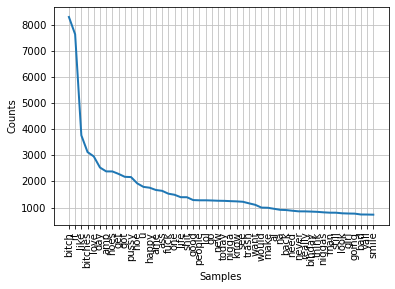

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [84]:
freq_dist.plot(50)

ISPEZIONE DEL TESTO CON nltk.Text

In [85]:
nltk_text = nltk.Text(tokenized_text)

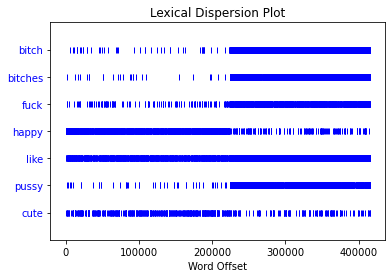

In [86]:
#how frequently a word appears in various parts of the text
nltk_text.dispersion_plot(['bitch','bitches','fuck', 'happy','like', 'pussy', 'cute'])